# UMAPs, growth rates and pulls of E8.0 --> E.25

This notebook creates all the UMAPs and the correlation-scatter plot show in the main figure

In [1]:
import numpy as np
import anndata
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
#from moscot.problems.time._lineage import TemporalProblem as tp

#sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(11,6)})

import mplscience

mplscience.set_style(reset_current=True)
plt.rcParams['figure.dpi'] = 200

In [2]:
Path="/home/mgander/mouse_atlas/data"
ts=['E3.5', 'E4.5', 'E5.25', 'E5.5', 'E6.25', 'E6.5', 'E6.75', 'E7.0', 'E7.25', 'E7.5', 'E7.75', 'E8.0', 'E8.25', 'E8.5a', 'E8.5b', 'E9.5', 'E10.5', 'E11.5', 'E12.5', 'E13.5']

cells=[32, 80, 100, 120, 400, 660, 1720, 4500, 8200, 15000, 30000, 60000, 73000, 90000, 90000, 200000, 1100000, 2600000, 6000000, 13000000]
Cell_number_dict={}

# Load anndatas and maps

In [3]:
i=11

ts0=ts[i]
print(ts0)
ts1=ts[i+1]

E8.0


In [4]:
adata=sc.read(f"{Path}/Comb_anndatas/adata_{ts0}_{ts1}.h5ad")

Only considering the two last: ['.25', '.h5ad'].
Only considering the two last: ['.25', '.h5ad'].


/home/mgander/jax_test/lib/python3.9/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [5]:
if 14>i>4:
    ExE_cell_types=['Embryonic visceral endoderm', 'Extraembryonic visceral endoderm', 'Parietal endoderm', 'Extraembryonic ectoderm', 'Primitive erythroid cells', 'Blood progenitors']
elif i>4:
    ExE_cell_types=['Extraembryonic visceral endoderm']
else:
    ExE_cell_types=[]
adata=adata[~adata.obs['cell_type'].isin(ExE_cell_types)].copy()

In [6]:
sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_pcaS')

0


/home/mgander/jax_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/mgander/jax_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/mgander/jax_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


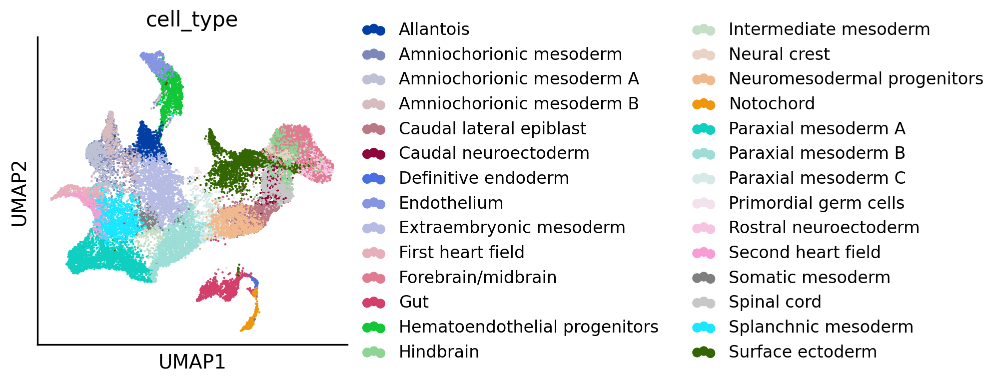

In [7]:
rs=0
print(rs)
sc.tl.umap(adata, random_state=rs)
sc.pl.umap(adata, color='cell_type', size=10)
plt.pause(0.001)

In [8]:
# Add growth rates and pull to A0
A0=adata[adata.obs['day']==8].copy()

df_gr=pd.read_pickle(f'{Path}/moscot_maps/growth_rates_and_pulls3/{ts0}_{ts1}_growth_rates.pkl')
A0.obs['gr_m']=df_gr['trained_growth_rate']
A0.obs['gr_t']=np.load(f'{Path}/TOME_maps/growth_rates_and_pulls/{ts0}_growth_rates.npy')

In [9]:
ct='E8.25:First heart field'
A0.obs['fhf_m']=np.load(f"{Path}/moscot_maps/growth_rates_and_pulls/{ts0}_{ct}_pulls.pkl", allow_pickle=True)
A0.obs['fhf_t']=np.load(f"{Path}/TOME_maps/growth_rates_and_pulls/{ts0}_{ct}_pull.npy", allow_pickle=True)

# Plot growth rates

In [10]:
# Only k biggest cell types
cts=list(A0.obs.value_counts('cell_type').index)[:5]
A0s=A0[A0.obs['cell_type'].isin(cts)].copy()

<Figure size 2000x1600 with 0 Axes>

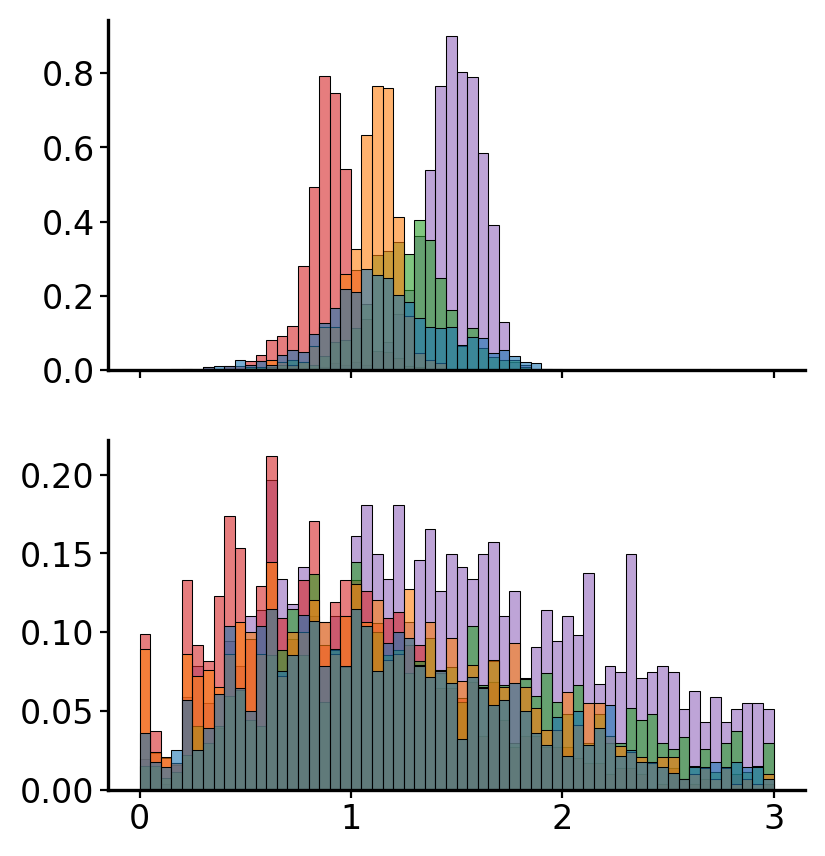

In [11]:
alpha=0.6

ns=61

plt.figure(figsize = [10, 8], dpi=200)

fig, axs = plt.subplots(2, 1, figsize=(4.5, 5))

g0=sns.histplot(ax=axs[0], data=A0s.obs, x='gr_m', hue='cell_type', bins=np.linspace(0,3,ns), 
             alpha=0.6, legend=False, stat='density')
g0.set(xlabel=None)
g0.set(xticklabels=[])
g0.set(ylabel=None)

g1=sns.histplot(ax=axs[1], data=A0s.obs, x='gr_t', hue='cell_type', bins=np.linspace(0,3,ns), 
             alpha=0.6, legend=False, stat='density')
g1.set(xlabel=None)
g1.set(ylabel=None)
plt.show()

# Visualize UMAPs

In [12]:
celltypes=sorted(set(A0.obs['cell_type']))
D_palette={}
D_palette[celltypes[0]]=np.array([124,134,189])/255
D_palette[celltypes[1]]=np.array([106,174,214])/255
D_palette[celltypes[2]]=np.array([255,175,96])/255
D_palette[celltypes[3]]=np.array([198,115,132])/255
D_palette[celltypes[4]]=np.array([181,187,23])/255
D_palette[celltypes[5]]=np.array([70,109,235])/255
D_palette[celltypes[6]]=np.array([132,148,231])/255
D_palette[celltypes[7]]=np.array([155,0,58])/255
D_palette[celltypes[8]]=np.array([240,172,185])/255
D_palette[celltypes[9]]=np.array([0,234,255])/255
D_palette[celltypes[10]]=np.array([228,42,105])/255
D_palette[celltypes[11]]=np.array([208,235,231])/255
D_palette[celltypes[12]]=np.array([103,201,120])/255
D_palette[celltypes[13]]=np.array([245,118,123])/255
D_palette[celltypes[14]]=np.array([238,210,196])/255
D_palette[celltypes[15]]=np.array([127,127,127])/255
D_palette[celltypes[16]]=np.array([196,162,219])/255
D_palette[celltypes[17]]=np.array([0,211,192])/255
D_palette[celltypes[18]]=np.array([136,224,214])/255
D_palette[celltypes[19]]=np.array([25,104,0])/255
D_palette[celltypes[20]]=np.array([197,116,0])/255
D_palette['ZZZ']=np.array([199,199,199])/255

In [13]:
mplscience.set_style(reset_current=True)
sc.set_figure_params(scanpy=True, dpi=300, frameon=True, vector_friendly=True, fontsize=14, 
                     figsize=(5,4), color_map=None)

/home/mgander/jax_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/mgander/jax_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/mgander/jax_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


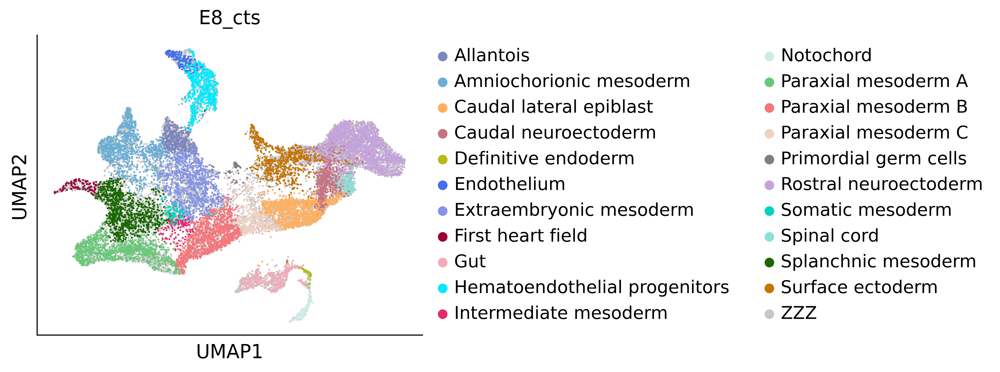

In [14]:
# Resort to put E8.25 to the back

adata.obs['E8_cts']=[a[3:] if a[:3]!='E8.' else 'ZZZ' for a in adata.obs['cell_state']]
a0i=adata[adata.obs['day']==8].obs.index
a1i=adata[adata.obs['day']==8.25].obs.index
adata=adata[[*a1i, *a0i],:].copy()
sc.pl.umap(adata, color='E8_cts', size=8, palette=D_palette)

# The legend

In [15]:
cell_types=sorted(set(adata.obs['E8_cts']))

selected_cell_types=cts

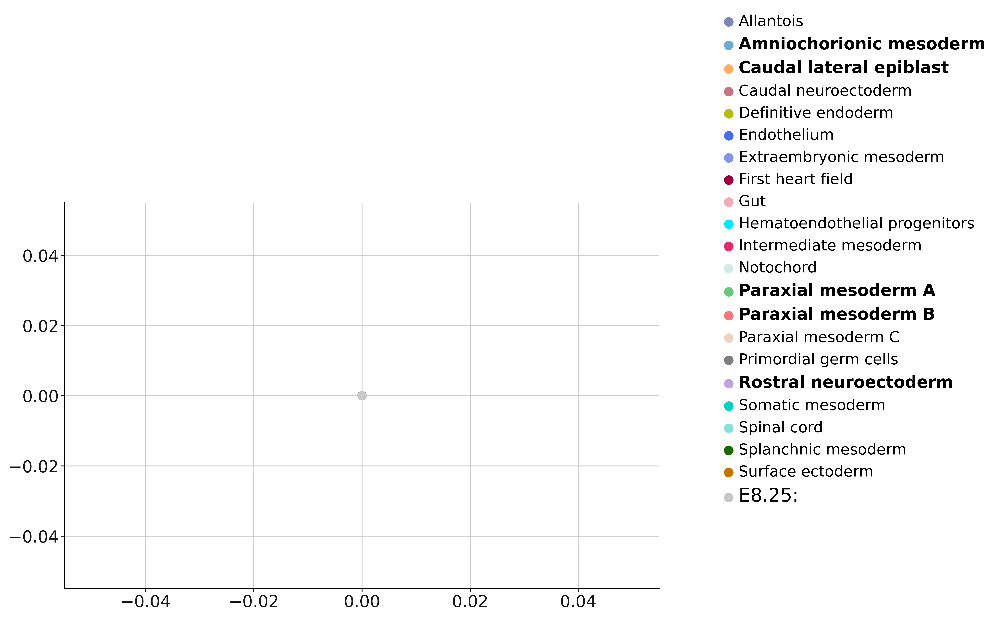

In [16]:
fig, ax = plt.subplots(figsize=(9, 6), dpi=300)
for i in range(len(cell_types)):
    ct=cell_types[i]
    ax.scatter(0, 0, label=ct, s=50, color=D_palette[cell_types[i]], alpha=1)
    
legend = ax.legend(loc=(1.1,0.2))

# To make selected cell types bold
for text in legend.get_texts():
    cell_type=str(text).split(', ')[2][1:-2]
    if cell_type=='ZZZ':
        text.set_fontsize(16)
        text.set_text("E8.25:")
        
    if cell_type in selected_cell_types:
        text.set_text(cell_type)
        text.set_fontweight("bold")
        text.set_fontsize(14)
        
#legend.legendHandles[11]._sizes = [300]

plt.show()

# Growth rate umaps

/home/mgander/jax_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


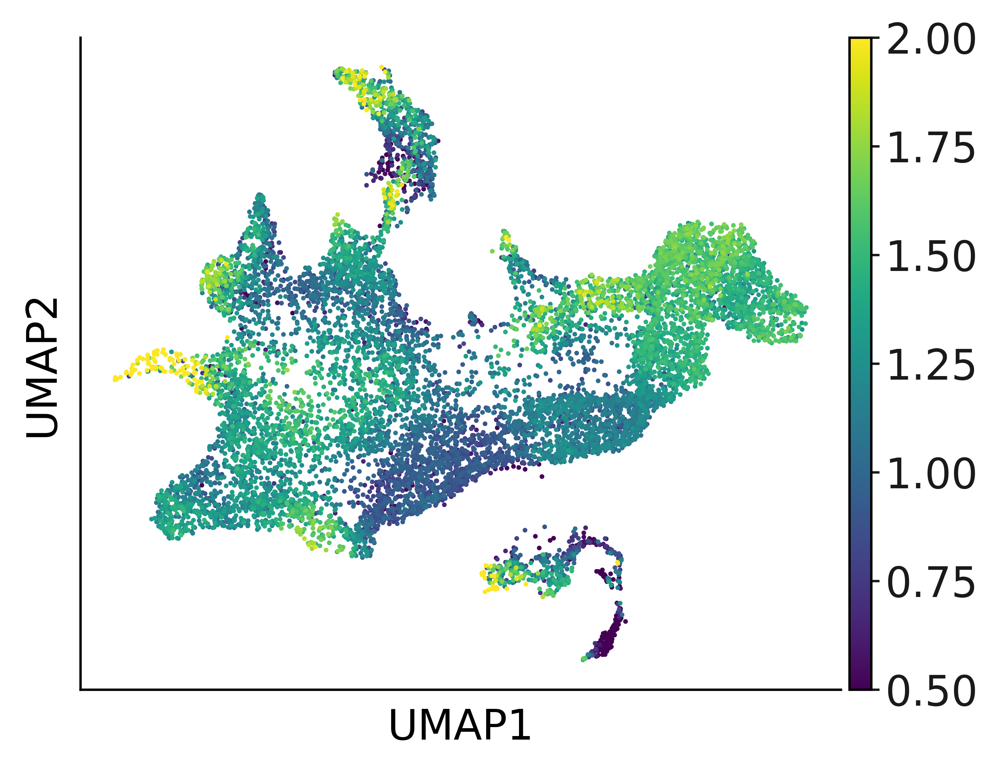

In [17]:
perc=99.9

sc.pl.umap(A0, color='gr_m', title='', vmin=0.5, vmax=2, size=10, legend_fontsize=10)

/home/mgander/jax_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


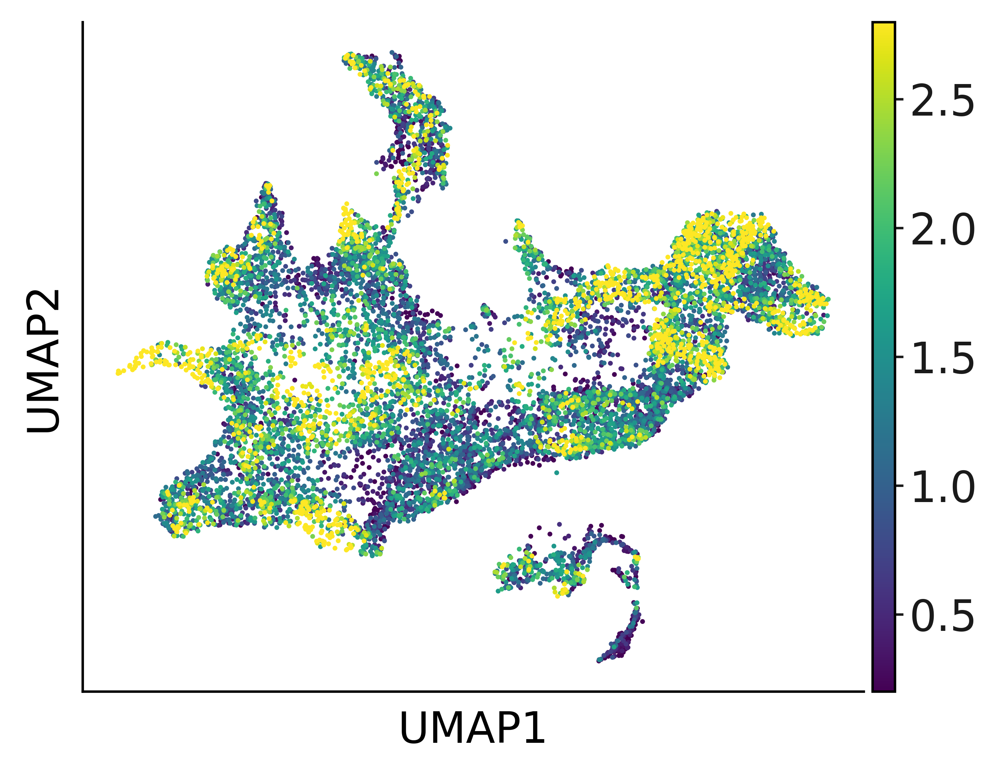

In [18]:
sc.pl.umap(A0, color='gr_t', title='', vmin=0.2, vmax=2.8, size=10, legend_fontsize=10)

# Pull Umaps

In [19]:
palette2=[(142,6,59),(51,102,0),
(72,12,12),
(199,199,199)]
palette2=[np.array(a)/255 for a in palette2]

In [20]:
mplscience.set_style(reset_current=True)
sc.set_figure_params(scanpy=True, dpi=400, frameon=True, vector_friendly=True, fontsize=14, 
                     figsize=(5,4), color_map=None)

/home/mgander/jax_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/mgander/jax_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/mgander/jax_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


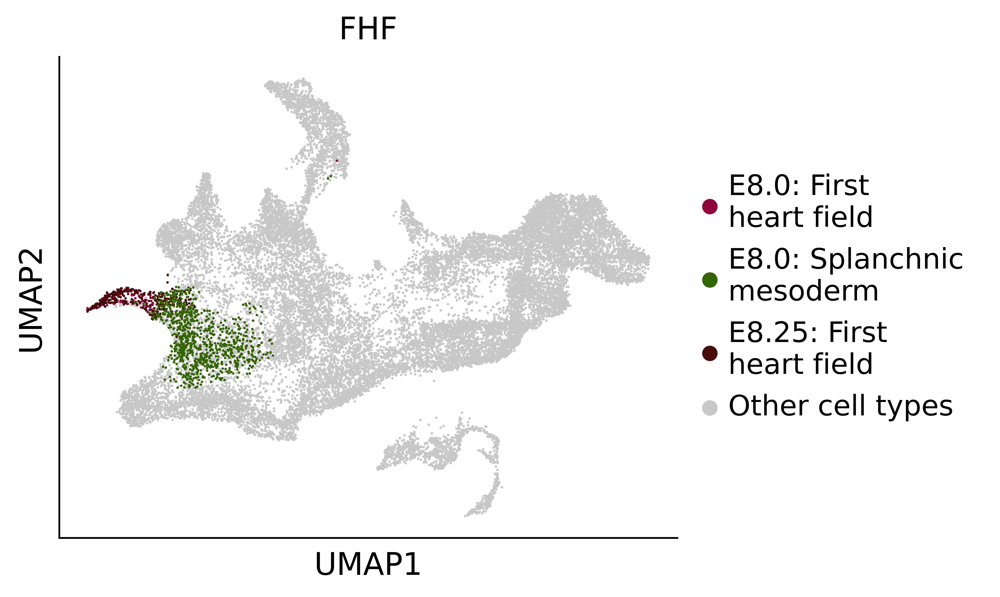

In [21]:
# Resort to put E8.25 to the back, and only color splanchnic mesoderm and first heart field

lst=[a if a in ['E8:Splanchnic mesoderm', 'E8.25:First heart field', 'E8:First heart field']  else 'Other cell types' for a in adata.obs['cell_state']]
lst=[a if a!='E8.25:First heart field' else 'E8.25: First \nheart field' for a in lst]
lst=[a if a!='E8:Splanchnic mesoderm' else 'E8.0: Splanchnic \nmesoderm' for a in lst]
lst=[a if a!='E8:First heart field' else 'E8.0: First \nheart field' for a in lst]
adata.obs['FHF']=lst
a00=adata[adata.obs['FHF']=='E8.25: First \nheart field'].obs.index
a01=adata[adata.obs['FHF']=='E8.0: First \nheart field'].obs.index
a02=adata[adata.obs['FHF']=='E8.0: Splanchnic \nmesoderm'].obs.index
a1i=adata[adata.obs['FHF']=='Other cell types'].obs.index
adata=adata[[*a1i, *a01, *a00, *a02],:].copy()
sc.pl.umap(adata, color='FHF', size=5, palette=palette2)

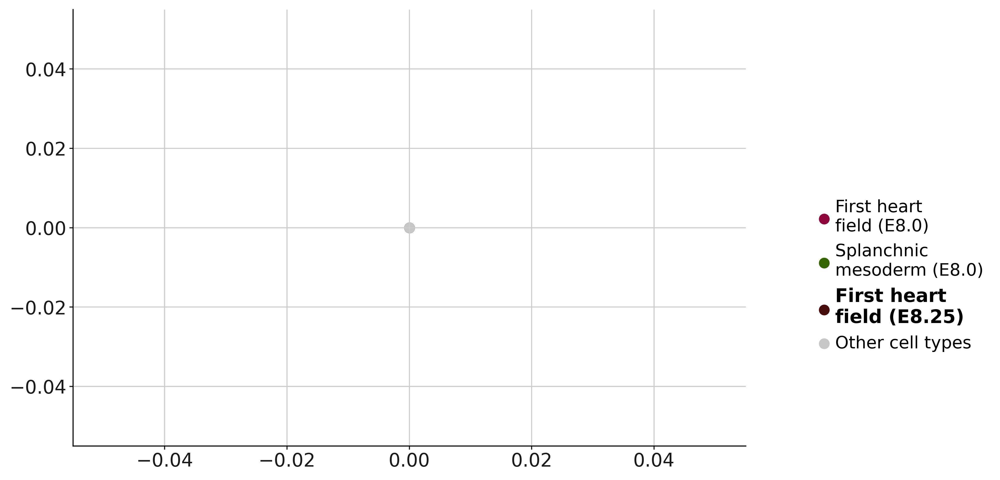

In [22]:
fig, ax = plt.subplots(figsize=(9, 6), dpi=200)

ct_fhf=['First heart \nfield (E8.0)', 'Splanchnic \nmesoderm (E8.0)', 'First heart \nfield (E8.25)', 
        'Other cell types']
for i in range(4):
    ct=ct_fhf[i]
    ax.scatter(0, 0, label=ct, s=50, color=palette2[i], alpha=1)
    
legend = ax.legend(loc=(1.1,0.2))

# To make selected cell types bold
l=0
for text in legend.get_texts():
    cell_type=str(text).split(', ')[2][1:-2]
        
    if l==2:
        text.set_fontweight("bold")
        text.set_fontsize(14)
    l+=1
        
#legend.legendHandles[11]._sizes = [300]

plt.show()

In [23]:
'''
fig, ax = plt.subplots(figsize=(9, 6), dpi=200)

ct_fhf=['Splanchnic \nmesoderm (E8.0)', 'First heart \nfield (E8.25)', 'Other cell types']
for i in range(3):
    ct=ct_fhf[i]
    ax.scatter(0, 0, label=ct, s=50, color=palette2[i], alpha=1)
    
legend = ax.legend(loc=(1.1,0.2))

# To make selected cell types bold
l=0
for text in legend.get_texts():
    cell_type=str(text).split(', ')[2][1:-2]
        
    if l==1:
        text.set_fontweight("bold")
        text.set_fontsize(14)
    l+=1
        
#legend.legendHandles[11]._sizes = [300]

plt.show()
'''

'\nfig, ax = plt.subplots(figsize=(9, 6), dpi=200)\n\nct_fhf=[\'Splanchnic \nmesoderm (E8.0)\', \'First heart \nfield (E8.25)\', \'Other cell types\']\nfor i in range(3):\n    ct=ct_fhf[i]\n    ax.scatter(0, 0, label=ct, s=50, color=palette2[i], alpha=1)\n    \nlegend = ax.legend(loc=(1.1,0.2))\n\n# To make selected cell types bold\nl=0\nfor text in legend.get_texts():\n    cell_type=str(text).split(\', \')[2][1:-2]\n        \n    if l==1:\n        text.set_fontweight("bold")\n        text.set_fontsize(14)\n    l+=1\n        \n#legend.legendHandles[11]._sizes = [300]\n\nplt.show()\n'

In [24]:
mplscience.set_style(reset_current=True)
sc.set_figure_params(scanpy=True, dpi=500, frameon=True, vector_friendly=True, fontsize=14, 
                     figsize=(5,4), color_map=None)

/home/mgander/jax_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


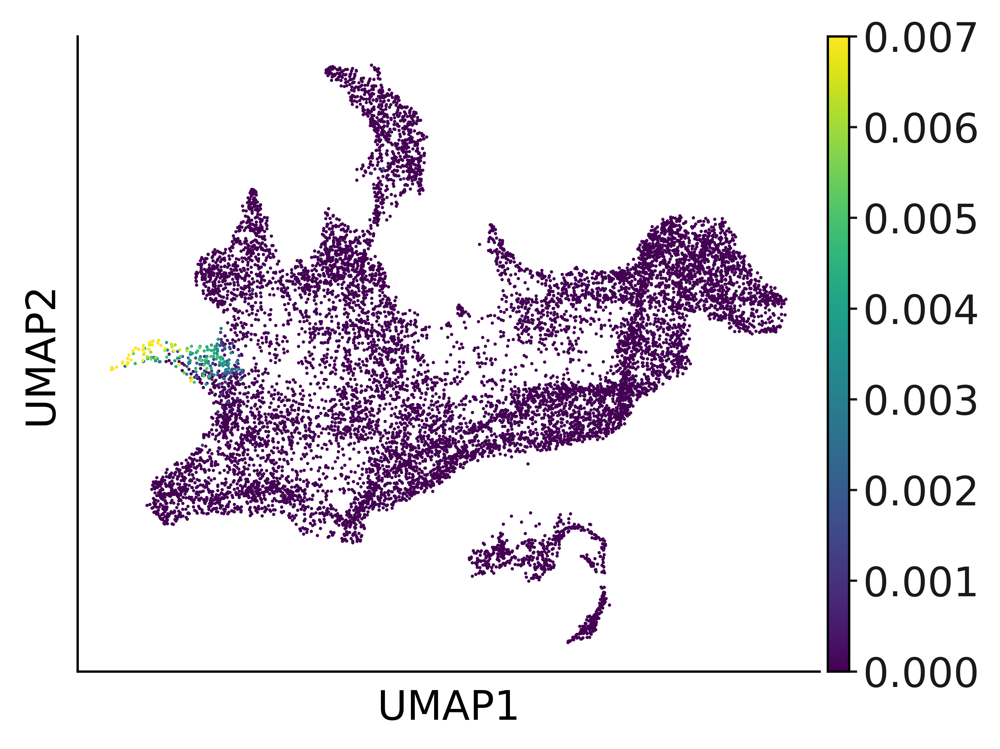

In [25]:
sc.pl.umap(A0, color='fhf_m', title='', vmax=0.007, size=5, legend_fontsize=10)
#sc.pl.umap(A0, color='fhf_m', title='', size=6, legend_fontsize=10)

In [26]:
# Save the anndata with the UMAP, growth_rates and pulls

In [27]:
adata.write(f'{Path}/Comb_anndatas/adata_{ts0}_{ts1}_annotated.h5ad', compression='gzip')

# Umaps for gene correlation

In [28]:
A0S=sc.read(f"{Path}/Comb_anndatas/scVI_anndatas/scvi_adata_{ts0}.h5ad")
A0S.var.index=list(A0S.var['gene_names'])

/home/mgander/jax_test/lib/python3.9/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [29]:
A0S=A0S[A0.obs.index]

In [30]:
drivers=['Nkx2-5', 'Tbx5', 'Tnnt2']

for d in drivers:
    loc=A0S.var.index.get_loc(d)
    
    A0.obs[d+'_pl']=list(A0S.layers['scvi_normalized'][:,loc])
A0.obs.columns=list(A0.obs.columns)

In [31]:
mplscience.set_style(reset_current=True)
sc.set_figure_params(scanpy=True, dpi=500, frameon=False, vector_friendly=True, fontsize=14, 
                     figsize=(5,4), color_map=None)

/home/mgander/jax_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


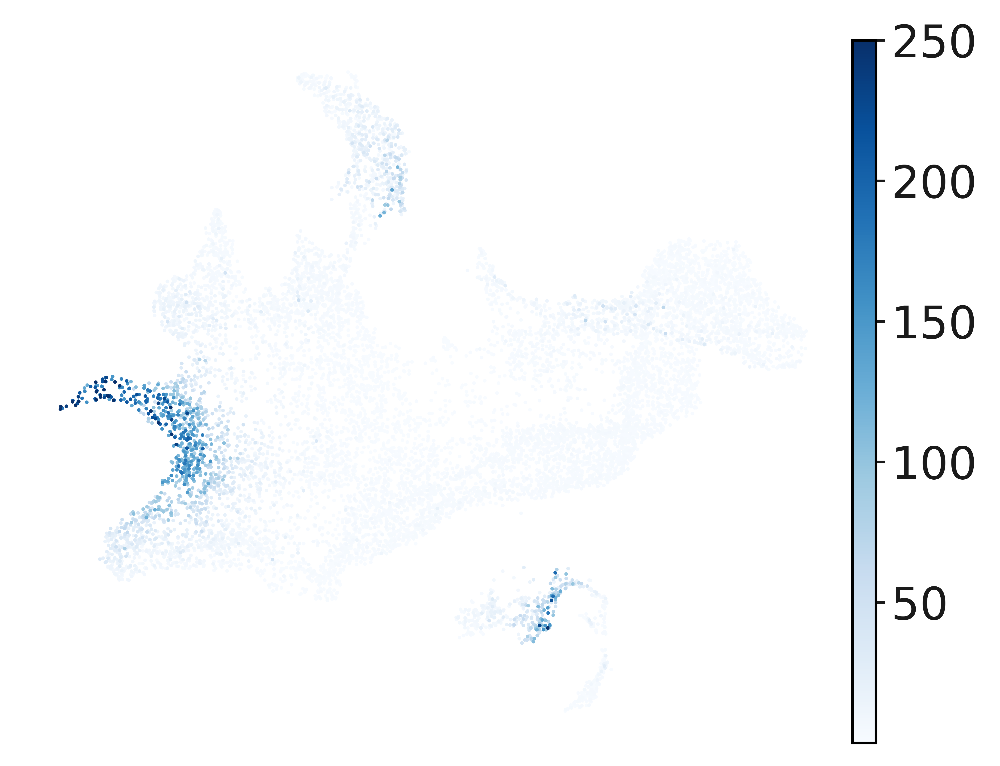

In [32]:
sc.pl.umap(A0, color='Nkx2-5'+'_pl', title='', color_map='Blues', size=5, vmax=250, legend_loc=(0,0))

/home/mgander/jax_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


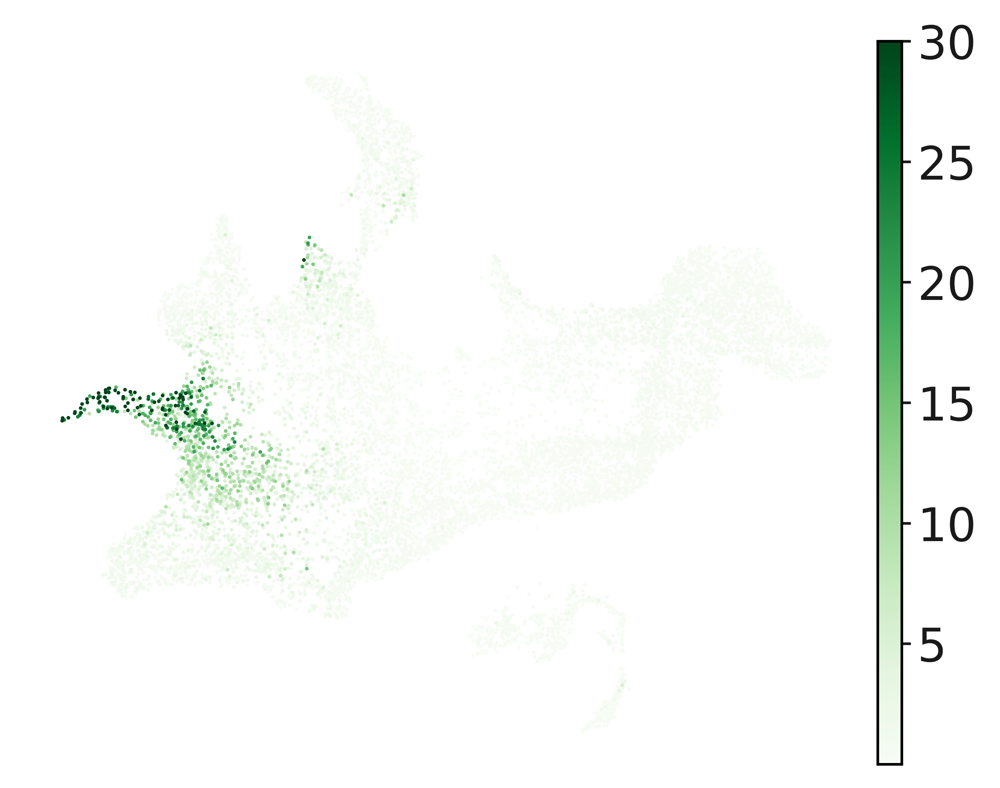

In [33]:
sc.pl.umap(A0, color='Tbx5'+'_pl', title='', color_map='Greens', size=5, vmax=30, legend_loc=(0,0))

/home/mgander/jax_test/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


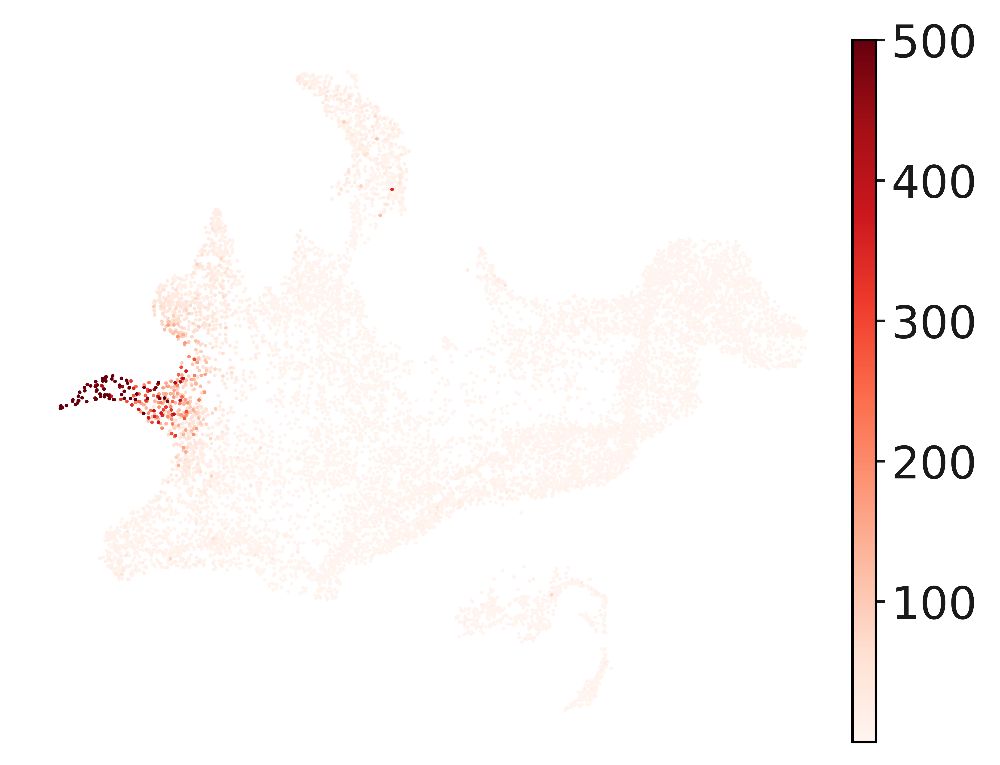

In [34]:
sc.pl.umap(A0, color='Tnnt2'+'_pl', title='', color_map='Reds', size=5, vmax=500, legend_loc=(0,0))

In [51]:
def col_map(v):
    r,g,b=v
    cdict2 = {'red':   [(0.0,  0, 0),
                       (1.0,  r,0)],
             'green': [(0.0,  0, 0),
                      (1.0,  g, 0)],
             'blue':  [(0.0,  0, 0.0),
                      (1.0,  b, 0)]} 
    my_cmap = matplotlib.colors.LinearSegmentedColormap('my_colormap2',cdict2,256)
    return(my_cmap)

In [52]:
def plt_cmap(cmap):
    plt.figure()
    a=np.outer(np.arange(0,1,0.01),np.ones(100))
    plt.imshow(a,aspect='auto', cmap =cmap)                   
    plt.show()

In [56]:
def col_dict(genes, k=-2):
    if gene=='Nkx2-5':
        col=sns.color_palette('Blues')[k]
    elif gene=='Tbx5':
        col=sns.color_palette('Greens')[k]
    elif gene=='Tnnt2':
        col=sns.color_palette('Reds')[k]
    return(col)

/tmp/ipykernel_32295/3658356248.py:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  exp=A0.obs[gene+'_pl'][wh]
/tmp/ipykernel_32295/3658356248.py:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  gM2=np.sqrt(A0.obs['fhf_m'][wh])
/tmp/ipykernel_32295/3658356248.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  gM3=gM2[wh]
/tmp/ipykernel_32295/3658356248.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprec

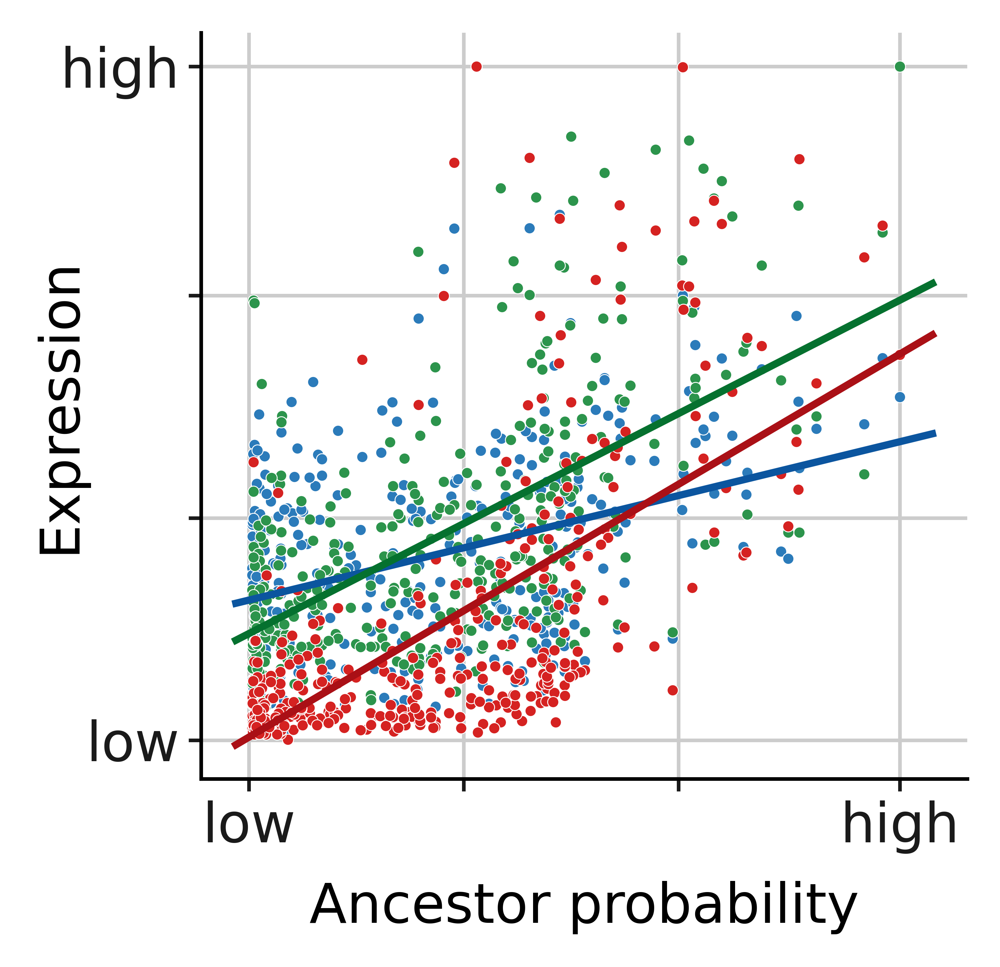

In [58]:
fontsize=12

import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(3, 3))

#for gene in ['Tnnt2', 'Tbx20', 'Cdkn1c', 'Bmp2', 'Ccdc141']:
for gene in drivers:

    ms=0.9
    cut=0.005
    #dcut=0
    
    loc=A0S.var.index.get_loc(gene)
    exp=A0S.layers['scvi_normalized'][:,loc]

    wh=np.where(A0S.obs['cell_state'].isin(['E8:Splanchnic mesoderm', 'E8:First heart field']))[0]
    exp=A0.obs[gene+'_pl'][wh]
    
    # sqrt to make plot look better. Doesn't matter mathematically, since we use spearman-correlation
    gM2=np.sqrt(A0.obs['fhf_m'][wh])
    
    gM2=gM2/gM2.max()
    exp=exp/exp.max()
    
    wh=np.where(gM2>cut)[0]
    
    gM3=gM2[wh]
    exp=exp[wh]
    
    exp=exp/exp.max()
    
    col=col_dict(gene)

    sns.scatterplot(x=gM3, y=exp, color=col, s=6, zorder=2)
    
    a,b=np.polyfit(gM3, exp, 1)
    
    
    def lin(xs,a,b):
        l=[]
        for x in xs:
            l.append(b+a*x)
        return(l)

    xs=np.linspace(-0.02,1.05,101)
    y=lin(xs,a,b)
    
    plt.plot(xs, y, linewidth=1.6, color=col_dict(gene, k=-1), zorder=3)

    ax.set_ylabel(ylabel='Expression', fontsize=fontsize)
    plt.yticks([0,0.33,0.66,1])
    ax.set_yticklabels(labels=['low', '','', 'high'],fontsize=fontsize)

    ax.set_xlabel(xlabel='Ancestor probability', fontsize=fontsize)
    plt.xticks([0,0.33,.66,1])
    ax.set_xticklabels(labels=['low', '', '', 'high'],fontsize=fontsize)

    ax.yaxis.set_label_coords(-0.15, 0.5)
plt.show()